## Image Segmentation aka image matting is one of the most important tasks of Image Processing. Building a model that recognises the background and foreground is an important task. 
## Potrait Matting aka potrait segmentation is a special case of Image Matting where the images are conmposed of only faces.

# Background

This notebook presents the potrait matting algorithm for the ***celeb faces*** dataset.The dataset was downloaded from [kaggle](https://www.kaggle.com/jessicali9530/celeba-dataset). Here we have used the **img_align_celeba** folder from the dataset that consists of 202,599 images of faces of celebs that have been cropped and alligned.   

In [5]:
import matplotlib.pyplot as plt
from PIL import Image
%matplotlib inline
import numpy as np

(218, 178, 3)


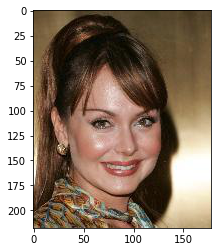

In [6]:
im = Image.open('img_align_celeba/000009.jpg') 
print(np.asarray(im).shape)
plt.imshow(np.asarray(im))

All images in the dataset are colour(RGB) images with a resolution of 218x178 pixels. The image consists of a face and a background with no object in the background. Our task here is to build a model that will identify the foreground from the background of the model.

To approach this probelm we use the concept of FCN from [this paper](https://arxiv.org/pdf/1605.06211.pdf), for semantic segmentation. The idea is very simple. The authors of the paper suggests that if we replace the fully connected layer of Convolution Neural Network(CNN) for object classification with a convolutional layer we recieve a filter for our image that produces pixelwise classification for the image. 
Here we are using a pre-trained FCN model on PASCAL VOC12 dataset. The dataset has 21 classes. 20 classes are for objects and 1 for background. The input images are reduced in the convolutional layers by using Maxpooling as downsampling. And Transpose Convolution is used for upsampling the labelled image back to the original shape of the input image.

##### Importing necesaary modules

In [7]:
import numpy as np
from keras.models import Sequential,Model
from keras.layers import Convolution2D, ZeroPadding2D, MaxPooling2D, Deconvolution2D, Cropping2D
from keras.layers import Input, Add, Dropout, Permute, add
from scipy.io import loadmat

Using TensorFlow backend.


In [8]:
# Function to create to a series of CONV layers followed by Max pooling layer
def Convblock(channel_dimension, block_no, no_of_convs) :
    Layers = []
    for i in range(no_of_convs) :
        
        Conv_name = "conv"+str(block_no)+"_"+str(i+1)
        
        # A constant kernel size of 3*3 is used for all convolutions
        Layers.append(Convolution2D(channel_dimension,kernel_size = (3,3),padding = "same",activation = "relu",name = Conv_name))
    
    Max_pooling_name = "pool"+str(block_no)
    
    #Addding max pooling layer
    Layers.append(MaxPooling2D(pool_size=(2, 2), strides=(2, 2),name = Max_pooling_name))
    
    return Layers

In [9]:
def FCN_8_helper(image_size):
    model = Sequential()
    model.add(Permute((1,2,3),input_shape = (image_size,image_size,3)))
    
    for l in Convblock(64,1,2) :
        model.add(l)
    
    for l in Convblock(128,2,2):
        model.add(l)
    
    for l in Convblock(256,3,3):
        model.add(l)
    
    for l in Convblock(512,4,3):
        model.add(l)
    
    for l in Convblock(512,5,3):
        model.add(l)
        
    model.add(Convolution2D(4096,kernel_size=(7,7),padding = "same",activation = "relu",name = "fc6"))
      
    #Replacing fully connnected layers of VGG Net using convolutions
    model.add(Convolution2D(4096,kernel_size=(1,1),padding = "same",activation = "relu",name = "fc7"))
    
    # Gives the classifications scores for each of the 21 classes including background
    model.add(Convolution2D(21,kernel_size=(1,1),padding="same",activation="relu",name = "score_fr"))
    
    Conv_size = model.layers[-1].output_shape[2] #16 if image size if 512
    #print(Conv_size)
    
    model.add(Deconvolution2D(21,kernel_size=(4,4),strides = (2,2),padding = "valid",activation=None,name = "score2"))
    
    # O = ((I-K+2*P)/Stride)+1 
    # O = Output dimesnion after convolution
    # I = Input dimnesion
    # K = kernel Size
    # P = Padding
    
    # I = (O-1)*Stride + K 
    Deconv_size = model.layers[-1].output_shape[2] #34 if image size is 512*512
    
    #print(Deconv_size)
    # 2 if image size is 512*512
    Extra = (Deconv_size - 2*Conv_size)
    
    #print(Extra)
    
    #Cropping to get correct size
    model.add(Cropping2D(cropping=((0,Extra),(0,Extra))))
    
    return model
    
    

In [10]:
output = FCN_8_helper(512)
print(len(output.layers))

24


In [11]:
output.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
permute_1 (Permute)          (None, 512, 512, 3)       0         
_________________________________________________________________
conv1_1 (Conv2D)             (None, 512, 512, 64)      1792      
_________________________________________________________________
conv1_2 (Conv2D)             (None, 512, 512, 64)      36928     
_________________________________________________________________
pool1 (MaxPooling2D)         (None, 256, 256, 64)      0         
_________________________________________________________________
conv2_1 (Conv2D)             (None, 256, 256, 128)     73856     
_________________________________________________________________
conv2_2 (Conv2D)             (None, 256, 256, 128)     147584    
_________________________________________________________________
pool2 (MaxPooling2D)         (None, 128, 128, 128)     0         
__________

In [12]:
def FCN_8(image_size):
    fcn_8 = FCN_8_helper(image_size)
    #Calculating conv size after the sequential block
    #32 if image size is 512*512
    Conv_size = fcn_8.layers[-1].output_shape[2] 
    
    #Conv to be applied on Pool4
    skip_con1 = Convolution2D(21,kernel_size=(1,1),padding = "same",activation=None, name = "score_pool4")
    
    #Addig skip connection which takes adds the output of Max pooling layer 4 to current layer
    Summed = add(inputs = [skip_con1(fcn_8.layers[14].output),fcn_8.layers[-1].output])
    
    #Upsampling output of first skip connection
    x = Deconvolution2D(21,kernel_size=(4,4),strides = (2,2),padding = "valid",activation=None,name = "score4")(Summed)
    x = Cropping2D(cropping=((0,2),(0,2)))(x)
    
    
    #Conv to be applied to pool3
    skip_con2 = Convolution2D(21,kernel_size=(1,1),padding = "same",activation=None, name = "score_pool3")
    
    #Adding skip connection which takes output og Max pooling layer 3 to current layer
    Summed = add(inputs = [skip_con2(fcn_8.layers[10].output),x])
    
    #Final Up convolution which restores the original image size
    Up = Deconvolution2D(21,kernel_size=(16,16),strides = (8,8),
                         padding = "valid",activation = None,name = "upsample")(Summed)
    
    #Cropping the extra part obtained due to transpose convolution
    final = Cropping2D(cropping = ((0,8),(0,8)))(Up)
    
    
    return Model(fcn_8.input, final)

In [13]:
model = FCN_8(512)

In [14]:
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
permute_2_input (InputLayer)    (None, 512, 512, 3)  0                                            
__________________________________________________________________________________________________
permute_2 (Permute)             (None, 512, 512, 3)  0           permute_2_input[0][0]            
__________________________________________________________________________________________________
conv1_1 (Conv2D)                (None, 512, 512, 64) 1792        permute_2[0][0]                  
__________________________________________________________________________________________________
conv1_2 (Conv2D)                (None, 512, 512, 64) 36928       conv1_1[0][0]                    
__________________________________________________________________________________________________
pool1 (Max

In [15]:
from keras.utils import plot_model

In [16]:
plot_model(model,"FCN-8with_shapes.png",show_shapes=True)

The **pascal-fcn8s-tvg-dag.mat** file is a pre-trained matlab file trained on the VOC12 dataset. We modify the classifier to act as a Fully Convolution Network(FCN). 

In [17]:
#Loading weights from matlab file
data = loadmat('pascal-fcn8s-tvg-dag.mat', matlab_compatible=False, struct_as_record=False)
layers = data['layers']
params = data['params']
description = data['meta'][0,0].classes[0,0].description

In [18]:
print(data.keys())

dict_keys(['__header__', '__version__', '__globals__', 'vars', 'params', 'layers', 'meta'])


In [19]:
print(layers.shape)

(1, 46)


In [20]:
#Inspecting layer names given in .mat file
for i in range(layers.shape[1]):
    print(i,
          str(layers[0,i].name[0]), str(layers[0,i].type[0]),
          [str(n[0]) for n in layers[0,i].inputs[0,:]],
          [str(n[0]) for n in layers[0,i].outputs[0,:]])

0 conv1_1 dagnn.Conv ['data'] ['conv1_1']
1 relu1_1 dagnn.ReLU ['conv1_1'] ['conv1_1x']
2 conv1_2 dagnn.Conv ['conv1_1x'] ['conv1_2']
3 relu1_2 dagnn.ReLU ['conv1_2'] ['conv1_2x']
4 pool1 dagnn.Pooling ['conv1_2x'] ['pool1']
5 conv2_1 dagnn.Conv ['pool1'] ['conv2_1']
6 relu2_1 dagnn.ReLU ['conv2_1'] ['conv2_1x']
7 conv2_2 dagnn.Conv ['conv2_1x'] ['conv2_2']
8 relu2_2 dagnn.ReLU ['conv2_2'] ['conv2_2x']
9 pool2 dagnn.Pooling ['conv2_2x'] ['pool2']
10 conv3_1 dagnn.Conv ['pool2'] ['conv3_1']
11 relu3_1 dagnn.ReLU ['conv3_1'] ['conv3_1x']
12 conv3_2 dagnn.Conv ['conv3_1x'] ['conv3_2']
13 relu3_2 dagnn.ReLU ['conv3_2'] ['conv3_2x']
14 conv3_3 dagnn.Conv ['conv3_2x'] ['conv3_3']
15 relu3_3 dagnn.ReLU ['conv3_3'] ['conv3_3x']
16 pool3 dagnn.Pooling ['conv3_3x'] ['pool3']
17 conv4_1 dagnn.Conv ['pool3'] ['conv4_1']
18 relu4_1 dagnn.ReLU ['conv4_1'] ['conv4_1x']
19 conv4_2 dagnn.Conv ['conv4_1x'] ['conv4_2']
20 relu4_2 dagnn.ReLU ['conv4_2'] ['conv4_2x']
21 conv4_3 dagnn.Conv ['conv4_2x'] ['co

In [21]:
#Inspecting filter and bias sizes 
for i in range(0, params.shape[1]-1, 2):
    print(i,
          str(params[0,i].name[0]), params[0,i].value.shape,
          str(params[0,i+1].name[0]), params[0,i+1].value.shape)

0 conv1_1f (3, 3, 3, 64) conv1_1b (64, 1)
2 conv1_2f (3, 3, 64, 64) conv1_2b (64, 1)
4 conv2_1f (3, 3, 64, 128) conv2_1b (128, 1)
6 conv2_2f (3, 3, 128, 128) conv2_2b (128, 1)
8 conv3_1f (3, 3, 128, 256) conv3_1b (256, 1)
10 conv3_2f (3, 3, 256, 256) conv3_2b (256, 1)
12 conv3_3f (3, 3, 256, 256) conv3_3b (256, 1)
14 conv4_1f (3, 3, 256, 512) conv4_1b (512, 1)
16 conv4_2f (3, 3, 512, 512) conv4_2b (512, 1)
18 conv4_3f (3, 3, 512, 512) conv4_3b (512, 1)
20 conv5_1f (3, 3, 512, 512) conv5_1b (512, 1)
22 conv5_2f (3, 3, 512, 512) conv5_2b (512, 1)
24 conv5_3f (3, 3, 512, 512) conv5_3b (512, 1)
26 fc6f (7, 7, 512, 4096) fc6b (4096, 1)
28 fc7f (1, 1, 4096, 4096) fc7b (4096, 1)
30 score_frf (1, 1, 4096, 21) score_frb (21, 1)
32 score2f (4, 4, 21, 21) score2b (21, 1)
34 score_pool4f (1, 1, 512, 21) score_pool4b (21, 1)
36 score4f (4, 4, 21, 21) score_pool3f (1, 1, 256, 21)
38 score_pool3b (21, 1) upsamplef (16, 16, 21, 21)


In [22]:
params.shape

(1, 40)

In [23]:
for i in range(0, params.shape[1]):
    print(i,
          str(params[0,i].name[0]), params[0,i].value.shape)

0 conv1_1f (3, 3, 3, 64)
1 conv1_1b (64, 1)
2 conv1_2f (3, 3, 64, 64)
3 conv1_2b (64, 1)
4 conv2_1f (3, 3, 64, 128)
5 conv2_1b (128, 1)
6 conv2_2f (3, 3, 128, 128)
7 conv2_2b (128, 1)
8 conv3_1f (3, 3, 128, 256)
9 conv3_1b (256, 1)
10 conv3_2f (3, 3, 256, 256)
11 conv3_2b (256, 1)
12 conv3_3f (3, 3, 256, 256)
13 conv3_3b (256, 1)
14 conv4_1f (3, 3, 256, 512)
15 conv4_1b (512, 1)
16 conv4_2f (3, 3, 512, 512)
17 conv4_2b (512, 1)
18 conv4_3f (3, 3, 512, 512)
19 conv4_3b (512, 1)
20 conv5_1f (3, 3, 512, 512)
21 conv5_1b (512, 1)
22 conv5_2f (3, 3, 512, 512)
23 conv5_2b (512, 1)
24 conv5_3f (3, 3, 512, 512)
25 conv5_3b (512, 1)
26 fc6f (7, 7, 512, 4096)
27 fc6b (4096, 1)
28 fc7f (1, 1, 4096, 4096)
29 fc7b (4096, 1)
30 score_frf (1, 1, 4096, 21)
31 score_frb (21, 1)
32 score2f (4, 4, 21, 21)
33 score2b (21, 1)
34 score_pool4f (1, 1, 512, 21)
35 score_pool4b (21, 1)
36 score4f (4, 4, 21, 21)
37 score_pool3f (1, 1, 256, 21)
38 score_pool3b (21, 1)
39 upsamplef (16, 16, 21, 21)


In [24]:
#Note : We are not transfering the weights of score4, score_pool3 and upsample because it doesn't follow the same 
# convention. The weights and biases for them are transferred below seperately

def copy_mat_of_keras(kmodel):
    kerasnames = [lr.name for lr in kmodel.layers]

    prmt = (0, 1, 2, 3) # WARNING : important setting as 2 of the 4 axis have same size dimension
    
    for i in range(0, 35, 2):
        #matname = '_'.join(params[0,i].name[0].split('_')[0:-1]) # this is for pascal-fcn8s-dag.mat
        matname = params[0,i].name[0][0:-1]   # this is for pascal-fcn8s-tvg-dag.mat
        if matname in kerasnames:
            print(matname)
            kindex = kerasnames.index(matname)
            print('found : ', (str(matname), kindex))
            l_weights = params[0,i].value
            l_bias = params[0,i+1].value
            f_l_weights = l_weights.transpose(prmt)
            if False: # WARNING : this depends on "image_data_format":"channels_last" in keras.json file
                f_l_weights = np.flip(f_l_weights, 0)
                f_l_weights = np.flip(f_l_weights, 1)
            print(f_l_weights.shape, kmodel.layers[kindex].get_weights()[0].shape)
            assert (f_l_weights.shape == kmodel.layers[kindex].get_weights()[0].shape)
            print(f_l_weights.shape)
            print("layer")
            print(kmodel.layers[kindex].get_weights()[0].shape)
            print("layer")
            assert (l_bias.shape[1] == 1)
            print(l_bias[:,0].shape)
            print("bias")
            print(kmodel.layers[kindex].get_weights()[1].shape)
            print("bias")
            assert (l_bias[:,0].shape == kmodel.layers[kindex].get_weights()[1].shape)
            assert (len(kmodel.layers[kindex].get_weights()) == 2)
            kmodel.layers[kindex].set_weights([f_l_weights, l_bias[:,0]])
        else:
            print('not found : ', str(matname))
    return kmodel

In [25]:
model = copy_mat_of_keras(model)

conv1_1
found :  ('conv1_1', 2)
(3, 3, 3, 64) (3, 3, 3, 64)
(3, 3, 3, 64)
layer
(3, 3, 3, 64)
layer
(64,)
bias
(64,)
bias
conv1_2
found :  ('conv1_2', 3)
(3, 3, 64, 64) (3, 3, 64, 64)
(3, 3, 64, 64)
layer
(3, 3, 64, 64)
layer
(64,)
bias
(64,)
bias
conv2_1
found :  ('conv2_1', 5)
(3, 3, 64, 128) (3, 3, 64, 128)
(3, 3, 64, 128)
layer
(3, 3, 64, 128)
layer
(128,)
bias
(128,)
bias
conv2_2
found :  ('conv2_2', 6)
(3, 3, 128, 128) (3, 3, 128, 128)
(3, 3, 128, 128)
layer
(3, 3, 128, 128)
layer
(128,)
bias
(128,)
bias
conv3_1
found :  ('conv3_1', 8)
(3, 3, 128, 256) (3, 3, 128, 256)
(3, 3, 128, 256)
layer
(3, 3, 128, 256)
layer
(256,)
bias
(256,)
bias
conv3_2
found :  ('conv3_2', 9)
(3, 3, 256, 256) (3, 3, 256, 256)
(3, 3, 256, 256)
layer
(3, 3, 256, 256)
layer
(256,)
bias
(256,)
bias
conv3_3
found :  ('conv3_3', 10)
(3, 3, 256, 256) (3, 3, 256, 256)
(3, 3, 256, 256)
layer
(3, 3, 256, 256)
layer
(256,)
bias
(256,)
bias
conv4_1
found :  ('conv4_1', 12)
(3, 3, 256, 512) (3, 3, 256, 512)
(3, 3, 2

In [26]:
kerasnames = [lr.name for lr in model.layers]

In [27]:
kerasnames


['permute_2_input',
 'permute_2',
 'conv1_1',
 'conv1_2',
 'pool1',
 'conv2_1',
 'conv2_2',
 'pool2',
 'conv3_1',
 'conv3_2',
 'conv3_3',
 'pool3',
 'conv4_1',
 'conv4_2',
 'conv4_3',
 'pool4',
 'conv5_1',
 'conv5_2',
 'conv5_3',
 'pool5',
 'fc6',
 'fc7',
 'score_fr',
 'score2',
 'score_pool4',
 'cropping2d_2',
 'add_1',
 'score4',
 'score_pool3',
 'cropping2d_3',
 'add_2',
 'upsample',
 'cropping2d_4']

In [28]:
#Getting the index of layer by name
kindex = kerasnames.index('score4')

In [29]:
kindex

27

In [30]:
l_weights = params[0,36].value

In [31]:
l_weights.shape

(4, 4, 21, 21)

In [32]:
bias = np.zeros(21)

In [33]:
#Giving weights and bias to corresponding layer
#Note : Bias is given as zero as it is absent in the .mat file
model.layers[27].set_weights([l_weights,bias])

In [34]:
#Getting the index of layer by name
kindex = kerasnames.index('score_pool3')

In [35]:
kindex

28

In [36]:
l_weights = params[0,37].value

In [37]:
l_weights.shape

(1, 1, 256, 21)

In [38]:
bias = params[0,38].value

In [39]:
bias.shape

(21, 1)

In [40]:
bias = bias[:,0]

In [41]:
bias.shape

(21,)

In [42]:
#Giving weights and bias to corresponding layer
model.layers[28].set_weights([l_weights,bias])

In [43]:
#Getting the index of layer by name
kindex = kerasnames.index('upsample')

In [44]:
kindex

31

In [45]:
lweights = params[0,39].value

In [46]:
lweights.shape

(16, 16, 21, 21)

In [47]:
bias = np.zeros(21)

In [48]:
#Giving weights and bias to corresponding layer
#Note : Bias is given as zero as it is absent in the .mat file
model.layers[31].set_weights([lweights,bias])

In [49]:
#!pip install -U scikit-image

In [50]:
from skimage.io import imread, imsave

In [51]:
import matplotlib.pyplot as plt
from PIL import Image
%matplotlib inline

We resize the images to fit to the dimensions of the pre-trained model i.e. (512,512,3).

In [52]:
import copy
import math

In [53]:
def prediction(kmodel, crpimg, transform=False):
	# INFO : crpimg should be a cropped image of the right dimension


	imarr = np.array(crpimg).astype(np.float32)

	if transform:
		imarr[:, :, 0] -= 129.1863
		imarr[:, :, 1] -= 104.7624
		imarr[:, :, 2] -= 93.5940
		
		aux = copy.copy(imarr)
		imarr[:, :, 0] = aux[:, :, 2]
		imarr[:, :, 2] = aux[:, :, 0]

	# imarr[:,:,0] -= 129.1863
	# imarr[:,:,1] -= 104.7624
	# imarr[:,:,2] -= 93.5940

	# imarr = imarr.transpose((2, 0, 1))
	imarr = np.expand_dims(imarr, axis=0)

	return kmodel.predict(imarr)

/home/karuna/anaconda3/lib/python3.6/site-packages/skimage/io/_io.py:141: UserWarning: annotation/annotation1_fcn8_1.png is a low contrast image
  warn('%s is a low contrast image' % fname)
Lossy conversion from int64 to uint8. Range [0, 19]. Convert image to uint8 prior to saving to suppress this warning.
/home/karuna/anaconda3/lib/python3.6/site-packages/skimage/io/_io.py:141: UserWarning: annotation/annotation1_fcn8_2.png is a low contrast image
  warn('%s is a low contrast image' % fname)
Lossy conversion from int64 to uint8. Range [0, 15]. Convert image to uint8 prior to saving to suppress this warning.
/home/karuna/anaconda3/lib/python3.6/site-packages/skimage/io/_io.py:141: UserWarning: annotation/annotation1_fcn8_3.png is a low contrast image
  warn('%s is a low contrast image' % fname)
Lossy conversion from int64 to uint8. Range [0, 18]. Convert image to uint8 prior to saving to suppress this warning.
/home/karuna/anaconda3/lib/python3.6/site-packages/skimage/io/_io.py:141: Us

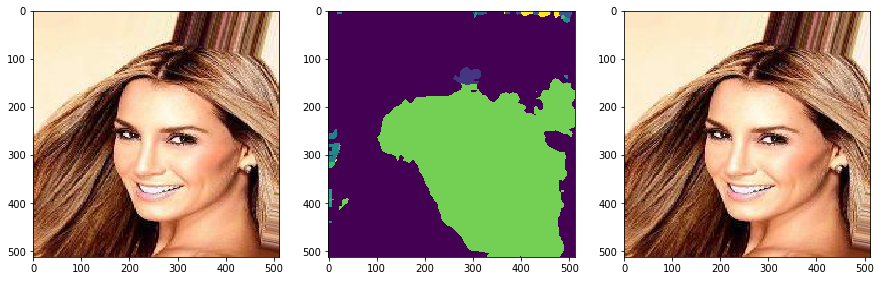

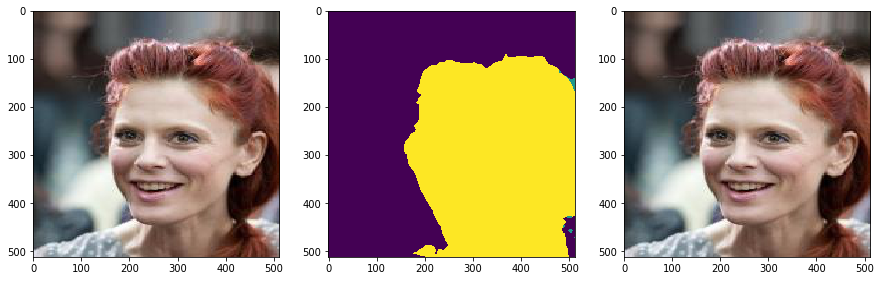

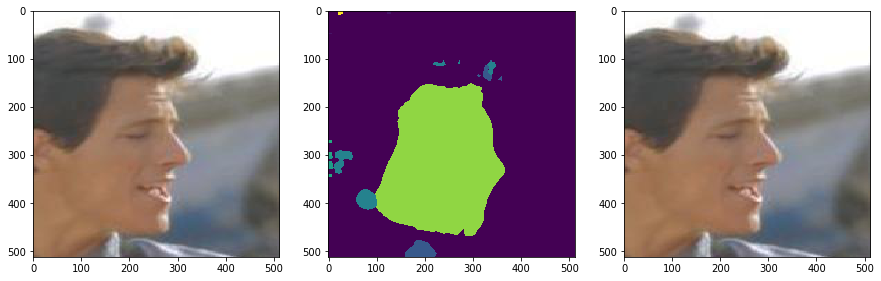

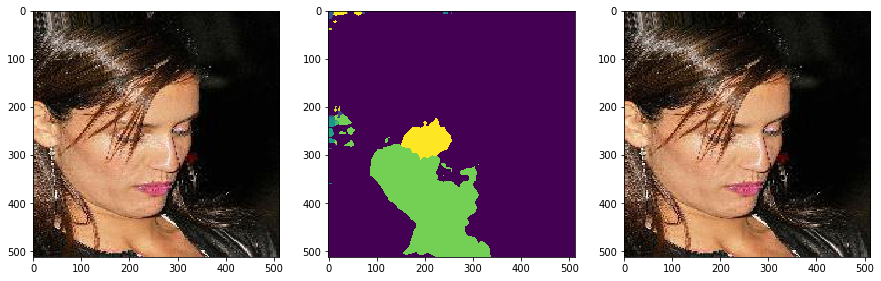

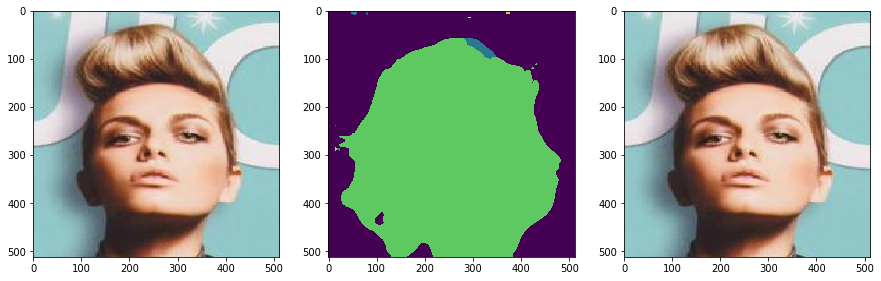

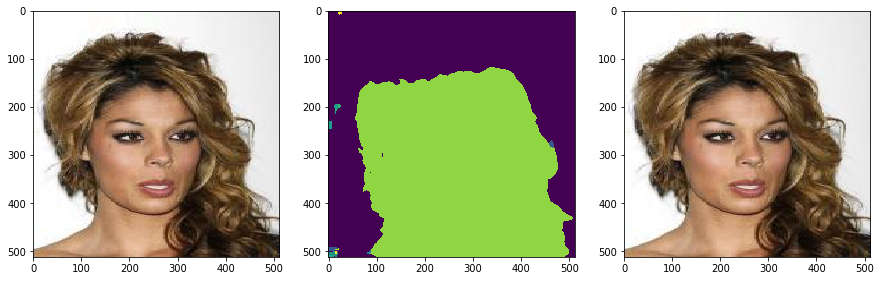

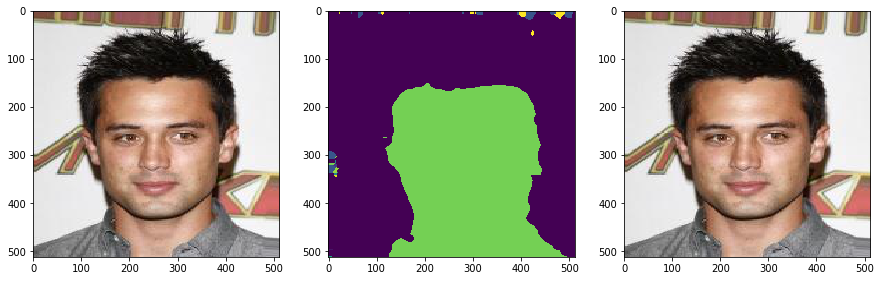

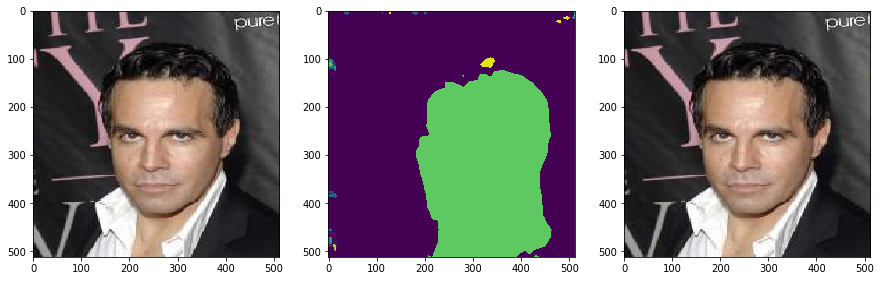

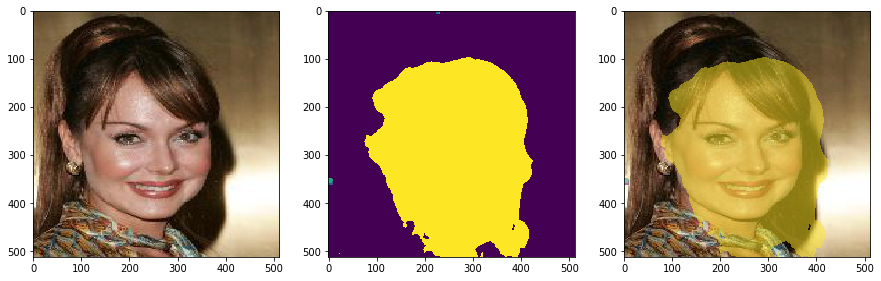

In [54]:
for i in range(1,10):
    im = Image.open('img_align_celeba/00000'+str(i)+'.jpg')
    im = im.resize((512,512))
    crpim = im 
    preds = prediction(model, crpim, transform=False) 
    imclass = np.argmax(preds, axis=3)[0,:,:]
    imsave("annotation/annotation1_fcn8_"+str(i)+".png",imclass)
    plt.figure(figsize = (15, 7))
    plt.subplot(1,3,1)
    plt.imshow( np.asarray(crpim) )
    plt.subplot(1,3,2)
    plt.imshow( imclass )
    plt.subplot(1,3,3)
    plt.imshow( np.asarray(crpim) )
    masked_imclass = np.ma.masked_where(imclass == 0, imclass)
#plt.imshow( imclass, alpha=0.5 )
plt.imshow( masked_imclass, alpha=0.5 )

We created annotations for 90 more images and they can be viewed here.

/home/karuna/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


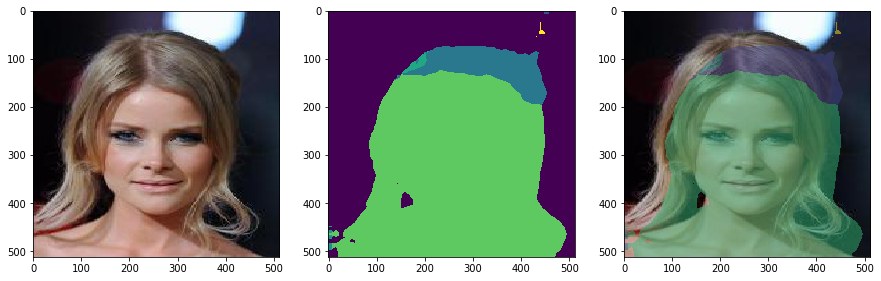

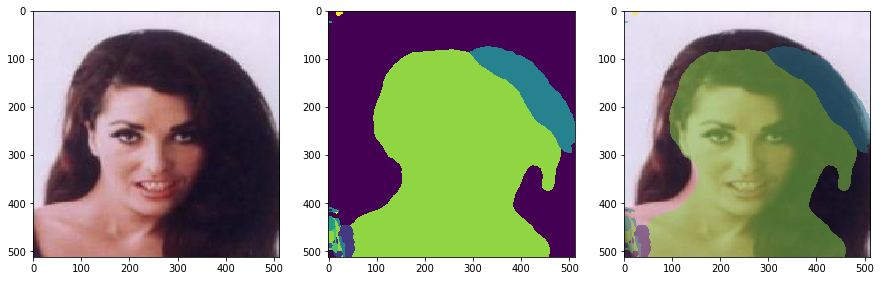

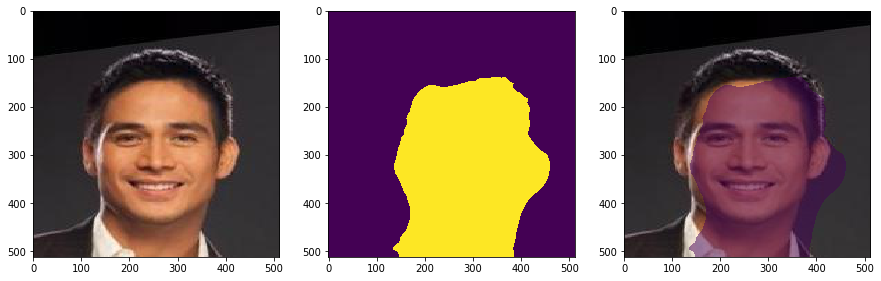

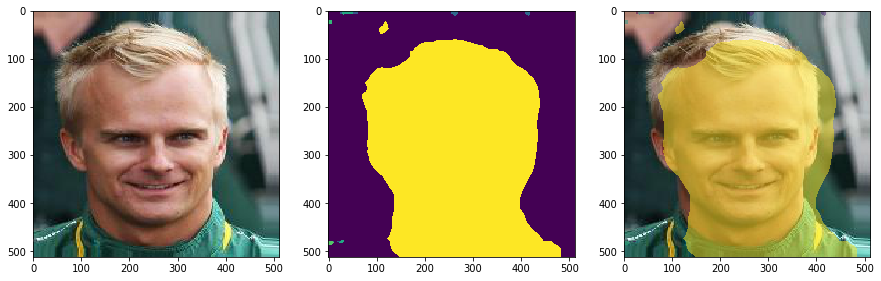

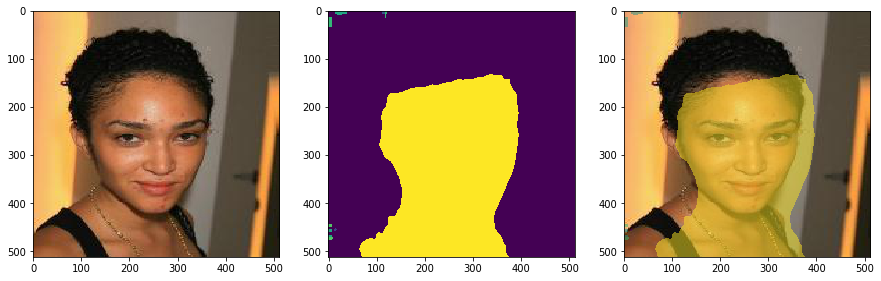

...

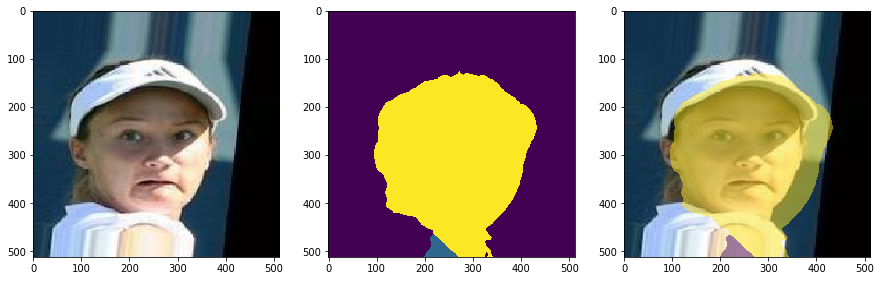

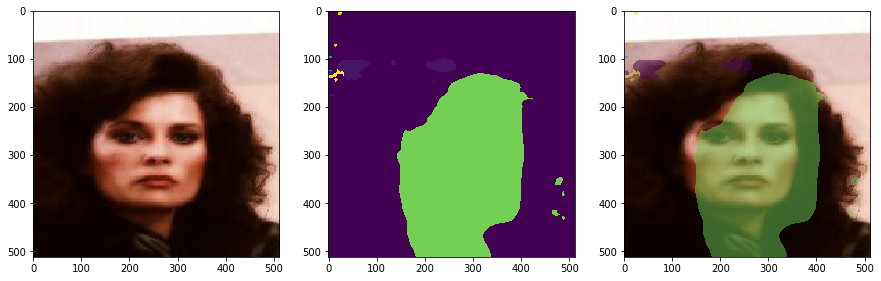

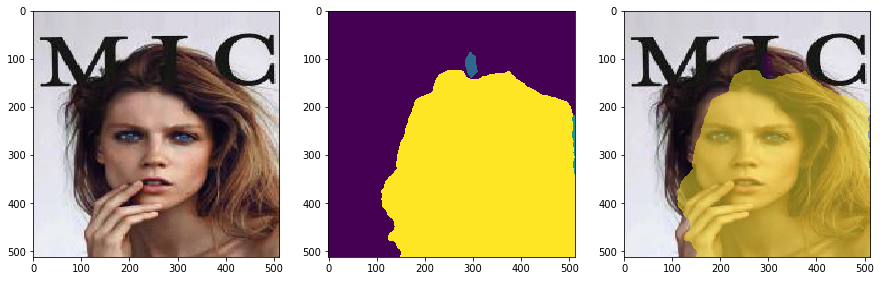

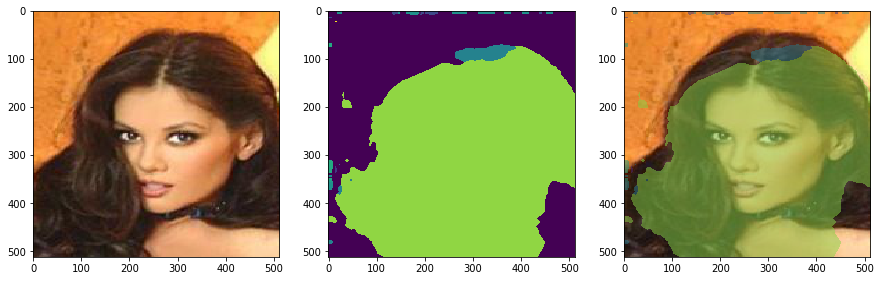

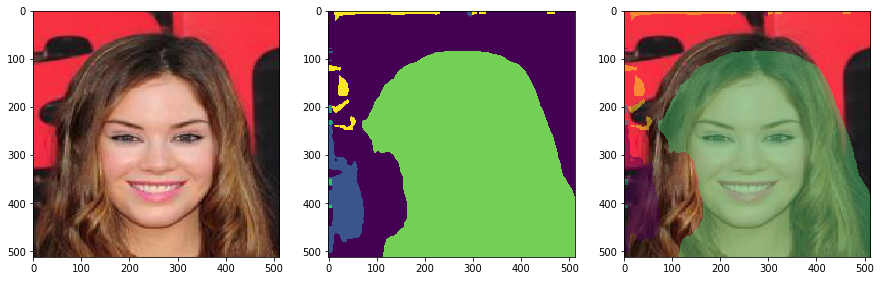

In [55]:
for i in range(10,100):
    im = Image.open('img_align_celeba/0000'+str(i)+'.jpg')
    im = im.resize((512,512))
    crpim = im 
    preds = prediction(model, crpim, transform=False) 
    imclass = np.argmax(preds, axis=3)[0,:,:]
    #imsave("annotation/annotation1_fcn8_"+str(i)+".png",imclass)
    plt.figure(figsize = (15, 7))
    plt.subplot(1,3,1)
    plt.imshow( np.asarray(crpim) )
    plt.subplot(1,3,2)
    plt.imshow( imclass )
    plt.subplot(1,3,3)
    plt.imshow( np.asarray(crpim) )
    masked_imclass = np.ma.masked_where(imclass == 0, imclass)
#plt.imshow( imclass, alpha=0.5 )
    plt.imshow( masked_imclass, alpha=0.5 )

FCN is a simple method for Semantic Segmentation but we can expect better results by using Instance Segmentation. We have implement Fast-RNN together with FCN to achieve better results.